In [5]:
import os
import sys
import numpy as np
import pandas as pd
import cv2
import time
import torch
import torch.utils.data as data
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import seaborn as sns
import wandb
import timm

from glob import glob
from PIL import Image
from sklearn.model_selection import train_test_split
from tqdm.notebook import tqdm
from time import time
from matplotlib import image
from torchvision import transforms, datasets, models
from torchensemble import BaggingClassifier

# Set model paths

In [120]:
model_dir = 'input/data/train/models'

first_model_path = os.path.join(model_dir, 'model_resnet152.pth')
second_model_path = os.path.join(model_dir, 'resnet34_epoch8.pth')
third_model_path = os.path.join(model_dir, 'resnet34_epoch7_simpletransform(nd).pth')
fourth_model_path = os.path.join(model_dir, 'resnet34_epoch8_separate_normalization(nd).pth')
fifth_model_path = os.path.join(model_dir, 'model_transformed.pth')
sixth_model_path = os.path.join(model_dir, 'resnet34_epoch8_separate_normalization(og).pth')

test_dir = '/opt/ml/input/data/eval'

# Set device

In [3]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu") # device object
device

device(type='cuda', index=0)

# Load all the models

In [14]:
first_model = models.resnet152(pretrained=True)
num_features = first_model.fc.in_features
first_model.fc = nn.Linear(num_features, 18) # binary classification (num_of_class == 2)
first_model.load_state_dict(torch.load(first_model_path))
first_model.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [15]:
second_model = models.resnet34(pretrained=True)
num_features = second_model.fc.in_features
second_model.fc = nn.Linear(num_features, 18) # binary classification (num_of_class == 2)
second_model.load_state_dict(torch.load(second_model_path))
second_model.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [16]:
third_model = models.resnet34(pretrained=True)
num_features = third_model.fc.in_features
third_model.fc = nn.Linear(num_features, 18) # binary classification (num_of_class == 2)
third_model.load_state_dict(torch.load(third_model_path))
third_model.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [17]:
fourth_model = models.resnet34(pretrained=True)
num_features = fourth_model.fc.in_features
fourth_model.fc = nn.Linear(num_features, 18) # binary classification (num_of_class == 2)
fourth_model.load_state_dict(torch.load(fourth_model_path))
fourth_model.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [19]:
fifth_model = models.resnext50_32x4d(pretrained=True)
num_features = fifth_model.fc.in_features
fifth_model.fc = nn.Linear(num_features, 18) # binary classification (num_of_class == 2)
fifth_model.load_state_dict(torch.load(fifth_model_path))
fifth_model.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
      (bn2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(128, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1

In [122]:
sixth_model = models.resnet34(pretrained=True)
num_features = sixth_model.fc.in_features
sixth_model.fc = nn.Linear(num_features, 18) # binary classification (num_of_class == 2)
sixth_model.load_state_dict(torch.load(sixth_model_path))
sixth_model.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [7]:
from torchensemble.utils import io

base_model = models.resnet152(pretrained=True)
num_features = base_model.fc.in_features
base_model.fc = nn.Linear(num_features, 18)

sixth_model = models.resnet152(pretrained=True)
sixth_model = BaggingClassifier(
    estimator=base_model,
    n_estimators=10,
    cuda=True,
)
sixth_model.set_optimizer('SGD',
                    momentum=0.9,
                    lr=1e-3,          
                    weight_decay=5e-4) 

sixth_model.to(device)

io.load(sixth_model, model_dir)  # reload

In [17]:
# seventh_model = timm.create_model('vit_base_patch16_224',pretrained=True,num_classes=18).to(device)
# seventh_model.load_state_dict(torch.load(seventh_model_path))
# seventh_model.to(device)

VisionTransformer(
  (patch_embed): PatchEmbed(
    (proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
    (norm): Identity()
  )
  (pos_drop): Dropout(p=0.0, inplace=False)
  (blocks): Sequential(
    (0): Block(
      (norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
      (attn): Attention(
        (qkv): Linear(in_features=768, out_features=2304, bias=True)
        (attn_drop): Dropout(p=0.0, inplace=False)
        (proj): Linear(in_features=768, out_features=768, bias=True)
        (proj_drop): Dropout(p=0.0, inplace=False)
      )
      (drop_path): Identity()
      (norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
      (mlp): Mlp(
        (fc1): Linear(in_features=768, out_features=3072, bias=True)
        (act): GELU()
        (fc2): Linear(in_features=3072, out_features=768, bias=True)
        (drop): Dropout(p=0.0, inplace=False)
      )
    )
    (1): Block(
      (norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
      (attn

# Predict the output

In [8]:
import torchvision

from torch.utils.data import Dataset, DataLoader
from torchvision.transforms import Resize, ToTensor, Normalize, CenterCrop
from torchvision import transforms

### Test dataset

In [9]:
class TestDataset(Dataset):
    def __init__(self, img_paths, transform):
        self.img_paths = img_paths
        self.transform = transform

    def __getitem__(self, index):
        image = Image.open(self.img_paths[index])

        if self.transform:
            image = self.transform(image)
        return image

    def __len__(self):
        return len(self.img_paths)

In [10]:
# meta 데이터와 이미지 경로를 불러옵니다.
submission = pd.read_csv(os.path.join(test_dir, 'info.csv'))
image_dir = os.path.join(test_dir, 'images')

In [11]:
# Test Dataset 클래스 객체를 생성하고 DataLoader를 만듭니다.
image_paths = [os.path.join(image_dir, img_id) for img_id in submission.ImageID]
transform = transforms.Compose([
    Resize((512, 384), Image.BILINEAR),
    ToTensor(),
    Normalize(mean=(0.5, 0.5, 0.5), std=(0.2, 0.2, 0.2)),
])
dataset = TestDataset(image_paths, transform)

loader = DataLoader(
    dataset,
    shuffle=False
)

### Show predicted results

In [23]:
mean=(0.5, 0.5, 0.5)
std=(0.2, 0.2, 0.2)

In [24]:
def imshow(input, title):
    # torch.Tensor => numpy
    input = input.numpy().transpose((1, 2, 0))
    # undo image normalization
    input = std * input + mean
    input = np.clip(input, 0, 1)
    # display images
    plt.imshow(input)
    plt.title(title)
    plt.show()

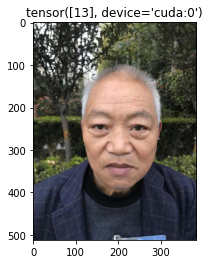

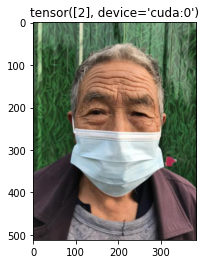

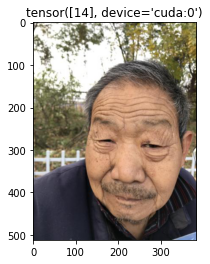

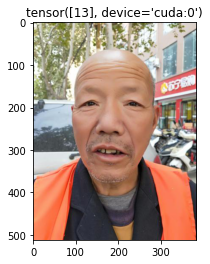

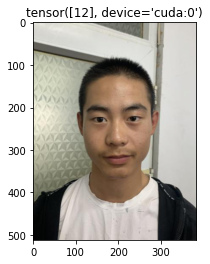

...

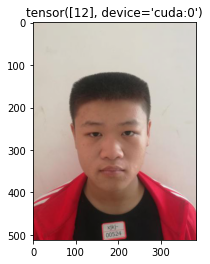

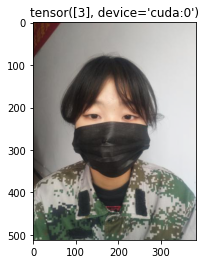

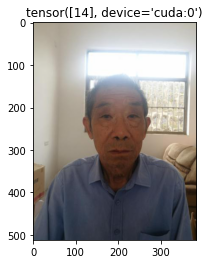

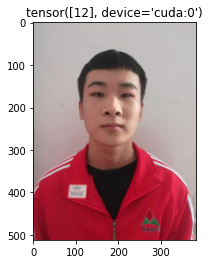

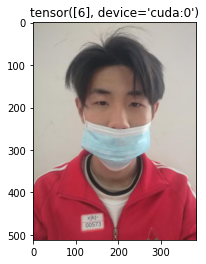

In [28]:
# Test gender model
first_model.eval()
second_model.eval()
third_model.eval()
fourth_model.eval()
fifth_model.eval()
sixth_model.eval()

start_time = time()

cnt = 0
with torch.no_grad():
    for inputs in tqdm(loader):
        cnt += 1
        
        inputs = inputs.to(device)

        first_output = first_model(inputs)
        second_output = second_model(inputs)
        third_output = third_model(inputs)
        fourth_output = fourth_model(inputs)
        fifth_output = fifth_model(inputs)
        sixth_output = sixth_model(inputs)
        
        avg = (first_output + second_output + third_output + fourth_output + fifth_output + sixth_output) / 6
#         avg = (first_output + second_output + third_output + fourth_output) / 4
        _, preds = torch.max(avg, 1)

        images = torchvision.utils.make_grid(inputs)
        imshow(images.cpu(), title=preds)
            
        if cnt == 200:
            break

# Take the average of the models

### save all outputs

In [123]:
# combined model
first_model.eval()
second_model.eval()
third_model.eval()
fourth_model.eval()
fifth_model.eval()
sixth_model.eval()

all_predictions = []
with torch.no_grad():
    for images in tqdm(loader):
        images = images.to(device)

        first_output = first_model(images)
        second_output = second_model(images)
        third_output = third_model(images)
        fourth_output = fourth_model(images)
        fifth_output = fifth_model(images)
        sixth_output = sixth_model(inputs)
        
        avg = (first_output + second_output + third_output + fourth_output + fifth_output + sixth_output) / 6
        _, preds = torch.max(avg, 1)
        all_predictions.append(preds.cpu().numpy())

KeyboardInterrupt: 

In [32]:
all_outputs[:5]

[array([[ -9.930344  ,  13.432024  ,   2.1025765 , -19.829527  ,
         -34.67109   , -26.460106  , -10.824063  ,  15.986537  ,
           5.072859  , -24.374126  , -21.528622  , -15.594873  ,
          16.206947  ,  51.71003   ,  40.302437  ,   0.89118713,
           6.9522743 ,  12.17737   ]], dtype=float32),
 array([[-8.4137917e-03,  8.5121040e+00,  4.5634789e+01,  6.4324083e+00,
         -1.2697733e+01,  2.6185324e+01, -1.2735357e+01, -4.5046067e+00,
          1.6515259e+01, -5.9426789e+00, -1.9262125e+01,  7.2499514e+00,
         -1.7772064e+01, -1.5501533e+01,  9.7340841e+00, -1.0826946e+01,
         -2.4725714e+01,  3.8827195e+00]], dtype=float32),
 array([[-1.2383150e+01, -8.1153746e+00,  1.0404530e+01, -1.4136189e+01,
         -4.2480431e+01, -1.0424542e+01, -1.3439471e+01,  5.3483853e+00,
          1.7690752e+01, -1.8527224e+01, -2.4373798e+01,  1.1796906e+00,
          2.8750761e+00,  2.8853949e+01,  4.7792690e+01,  2.3121813e-01,
          8.0431700e-03,  2.7918596e+01]],

In [33]:
output_dict = {'output': all_outputs}

output_df = pd.DataFrame(output_dict)
output_df.to_csv(os.path.join('input/data/train/csvs', 'five_model_voting.csv'))

### Combine all models

In [34]:
five_model_df = pd.read_csv('input/data/train/csvs/five_model_voting.csv')
five_model_df.head()

,Unnamed: 0,output
0,0,[[ -9.930344 13.432024 2.1025765 -19.8...
1,1,[[-8.4137917e-03 8.5121040e+00 4.5634789e+01...
2,2,[[-1.2383150e+01 -8.1153746e+00 1.0404530e+01...
3,3,[[-11.167042 1.2454967 -1.8033149 -19.9705...
4,4,[[ 15.298258 -10.302556 -12.876226 -17.9901...


In [84]:
five_model_predictions = []
for i in range(len(five_model_df)):
    str_output = five_model_df.iloc[i]["output"]
    numbers = str_output[2:-2].split()
    tmp_array = []
    for i in range(len(numbers)):
        tmp_array.append(float(numbers[i]))
    five_model_predictions.append(tmp_array)

five_model_predictions[:5]

[[-9.930344,
  13.432024,
  2.1025765,
  -19.829527,
  -34.67109,
  -26.460106,
  -10.824063,
  15.986537,
  5.072859,
  -24.374126,
  -21.528622,
  -15.594873,
  16.206947,
  51.71003,
  40.302437,
  0.89118713,
  6.9522743,
  12.17737],
 [-0.0084137917,
  8.512104,
  45.634789,
  6.4324083,
  -12.697733,
  26.185324,
  -12.735357,
  -4.5046067,
  16.515259,
  -5.9426789,
  -19.262125,
  7.2499514,
  -17.772064,
  -15.501533,
  9.7340841,
  -10.826946,
  -24.725714,
  3.8827195],
 [-12.38315,
  -8.1153746,
  10.40453,
  -14.136189,
  -42.480431,
  -10.424542,
  -13.439471,
  5.3483853,
  17.690752,
  -18.527224,
  -24.373798,
  1.1796906,
  2.8750761,
  28.853949,
  47.79269,
  0.23121813,
  0.00804317,
  27.918596],
 [-11.167042,
  1.2454967,
  -1.8033149,
  -19.970594,
  -42.061176,
  -27.563635,
  -7.218349,
  15.655321,
  8.049671,
  -21.024546,
  -19.415157,
  -11.449094,
  18.285368,
  47.731342,
  40.409084,
  3.3900814,
  10.019247,
  16.741554],
 [15.298258,
  -10.302556,
  -

In [86]:
vit_model_df = pd.read_csv('input/data/train/csvs/vit_combine_ver3.csv')
vit_model_df.head()

,Unnamed: 0,output
0,0,[[-20.874634 15.527871 21.467245 -29.2...
1,1,[[ 2.8485355 29.957611 55.593994 -3.4871...
2,2,[[-30.5477 9.616135 19.006727 -36.9...
3,3,[[-25.510586 10.393366 19.49624 -27.0493...
4,4,[[ 19.76675 -6.9260693 -26.520039 -2.7219...


In [87]:
vit_model_predictions = []
for i in range(len(vit_model_df)):
    str_output = vit_model_df.iloc[i]["output"]
    numbers = str_output[2:-2].split()
    tmp_array = []
    for i in range(len(numbers)):
        tmp_array.append(float(numbers[i]))
    vit_model_predictions.append(tmp_array)

vit_model_predictions[:5]

[[-20.874634,
  15.527871,
  21.467245,
  -29.218876,
  -38.21236,
  -21.77459,
  -19.392557,
  11.690644,
  12.700901,
  -21.851463,
  -29.387922,
  -21.412243,
  5.6383653,
  46.486095,
  50.96112,
  0.31316447,
  7.363759,
  17.535618],
 [2.8485355,
  29.957611,
  55.593994,
  -3.4871137,
  -12.9167595,
  27.376562,
  -10.726135,
  1.5320349,
  26.187086,
  -13.781334,
  -31.414278,
  0.2449584,
  -16.795898,
  -7.027078,
  14.32609,
  -24.740137,
  -34.81443,
  -2.983586],
 [-30.5477,
  9.616135,
  19.006727,
  -36.97326,
  -37.594215,
  -4.3528233,
  -22.182531,
  9.71299,
  21.14309,
  -21.158482,
  -26.10572,
  1.0823147,
  -0.61039793,
  39.22196,
  49.291252,
  -8.920273,
  -0.8219714,
  29.286312],
 [-25.510586,
  10.393366,
  19.49624,
  -27.049309,
  -41.86232,
  -21.192263,
  -18.071419,
  13.357338,
  20.779337,
  -13.244595,
  -26.98867,
  -9.933332,
  2.5895655,
  42.400246,
  49.527443,
  1.1981786,
  0.411811,
  12.291319],
 [19.76675,
  -6.9260693,
  -26.520039,
  -2

In [91]:
five_model_predictions = np.array(five_model_predictions)
vit_model_predictions = np.array(vit_model_predictions)
type(vit_model_predictions)

numpy.ndarray

### Apply Weight (1 for five_model, 0.5 for vit model)

In [124]:
all_predictions = []
for i in range(len(vit_model_predictions)):
    avg = (vit_model_predictions[i] * 0.1 + five_model_predictions[i]) / 10
    predicted = np.argmax(avg)
    all_predictions.append(predicted)

In [125]:
submission['ans'] = all_predictions

# 제출할 파일을 저장합니다.
submission.to_csv(os.path.join(test_dir, 'weight(0.1).csv'), index=False)
print('test inference is done!')

test inference is done!


In [29]:
# combined model
first_model.eval()
second_model.eval()
third_model.eval()
fourth_model.eval()
# fifth_model.eval()
# sixth_model.eval()

all_predicted_labels = []
with torch.no_grad():
    for images in tqdm(loader):
        images = images.to(device)

        first_output = first_model(images)
        second_output = second_model(images)
        third_output = third_model(images)
        fourth_output = fourth_model(images)
#         fifth_output = fifth_model(images)
#         sixth_output = sixth_model(images)

#         avg = (first_output + second_output + third_output + fourth_output + fifth_output + sixth_output) / 6
        avg = (first_output + second_output + third_output + fourth_output) / 4
        _, predicted = torch.max(avg, 1)
        predicted = int(predicted.cpu().numpy())
        all_predicted_labels.append(predicted)

# Submission

In [ ]:
submission['ans'] = all_predictions

# 제출할 파일을 저장합니다.
submission.to_csv(os.path.join(test_dir, 'final_submission.csv'), index=False)
print('test inference is done!')